# Wood Surface Defect Detection — YOLOv8 Training

**Dataset:** Large Scale Image Dataset of Wood Surface Defects (Kaggle)

**Classes (8):** Quartzity, Live_Knot, Marrow, Resin, Dead_Knot, Knot_with_crack, Knot_missing, Crack

**Strategy:** Transfer learning with YOLOv8n + Class-Aware Augmentation for minority classes

---
## Step 1: System Check & Dependencies

In [1]:
# Install ultralytics (YOLOv8) and kaggle quietly
import subprocess, sys, warnings
warnings.filterwarnings('ignore')

subprocess.run([sys.executable, '-m', 'pip', 'install', '-q', 'ultralytics', 'kaggle', 'albumentations'],
               capture_output=True)

import torch
print(f'PyTorch version: {torch.__version__}')
print(f'CUDA available: {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU device: {torch.cuda.get_device_name(0)}')
    print(f'VRAM: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB')
else:
    print('WARNING: No GPU detected — training will be VERY slow!')

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU device: Tesla T4
VRAM: 14.6 GB


---
## Step 2: Download Dataset (Auto-download or Manual Upload)

In [2]:
import os, zipfile, shutil, re
from pathlib import Path

# ===== SET YOUR KAGGLE API TOKEN HERE =====
KAGGLE_TOKEN = 'KGAT_673600345f7f0ffa437c9d9fd2ec2580'
# ==========================================

# Write token for kaggle CLI
kaggle_dir = Path.home() / '.kaggle'
kaggle_dir.mkdir(parents=True, exist_ok=True)
(kaggle_dir / 'access_token').write_text(KAGGLE_TOKEN)
(kaggle_dir / 'access_token').chmod(0o600)

DATASET_DIR = Path('/content/wood_defect_dataset')
DATASET_SLUG = 'nomihsa965/large-scale-image-dataset-of-wood-surface-defects'

if DATASET_DIR.exists() and len(list(DATASET_DIR.rglob('*.jpg'))) > 100:
    print(f'Dataset already ready. Skipping.')
else:
    if DATASET_DIR.exists():
        shutil.rmtree(DATASET_DIR)

    !kaggle datasets download {DATASET_SLUG} -p /content/

    zip_path = Path('/content/large-scale-image-dataset-of-wood-surface-defects.zip')
    if not zip_path.exists():
        # Try alternate filename
        zips = list(Path('/content/').glob('*.zip'))
        zip_path = zips[0] if zips else None

    if zip_path is None:
        raise FileNotFoundError('Kaggle download failed. No zip found.')

    print(f'Extracting {zip_path.name}...')
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(DATASET_DIR)
    zip_path.unlink()

jpg_count = len(list(DATASET_DIR.rglob('*.jpg')))
txt_count = len([f for f in DATASET_DIR.rglob('*.txt') if re.match(r'^\d+\.txt$', f.name)])
print(f'Dataset: {jpg_count} images, {txt_count} labels')
if jpg_count == 0:
    print('ERROR: No images found. Contents:', [p.name for p in DATASET_DIR.iterdir()][:15])

Dataset URL: https://www.kaggle.com/datasets/nomihsa965/large-scale-image-dataset-of-wood-surface-defects
License(s): Attribution 4.0 International (CC BY 4.0)
100% 3.09G/3.09G [03:03<00:00, 18.1MB/s]

Extracting large-scale-image-dataset-of-wood-surface-defects.zip...
Dataset: 4000 images, 4000 labels


---
## Step 3: Dataset Verification & Auto-Configuration

In [3]:
import os
from pathlib import Path
from collections import Counter

DATASET_DIR = Path('/content/wood_defect_dataset')

# Look for images and labels — the dataset may have nested folders
all_images = sorted(DATASET_DIR.rglob('*.jpg')) + sorted(DATASET_DIR.rglob('*.png')) + sorted(DATASET_DIR.rglob('*.bmp'))
all_labels = sorted(DATASET_DIR.rglob('*.txt'))

# Filter out any txt files that aren't YOLO labels (like readme)
import re
label_files = [f for f in all_labels if re.match(r'^\d+\.txt$', f.name)]

print(f'Total images found: {len(all_images)}')
print(f'Total label files found: {len(label_files)}')

# Count annotations per class
class_counts = Counter()
empty_labels = 0

for lbl_path in label_files:
    lines = lbl_path.read_text().strip().split('\n')
    has_anno = False
    for line in lines:
        line = line.strip()
        if not line:
            continue
        parts = line.split()
        if len(parts) >= 5:
            cls_id = int(parts[0])
            class_counts[cls_id] += 1
            has_anno = True
    if not has_anno:
        empty_labels += 1

NAMES = {
    0: 'Quartzity',
    1: 'Live_Knot',
    2: 'Marrow',
    3: 'Resin',
    4: 'Dead_Knot',
    5: 'Knot_with_crack',
    6: 'Knot_missing',
    7: 'Crack',
}

NC = len(NAMES)

print(f'\nNumber of classes: {NC}')
print(f'Empty label files (no defects): {empty_labels}')
print(f'Total annotations: {sum(class_counts.values())}')
print(f'\n{"Class":<20} {"ID":<4} {"Count":<8} {"%":<8}')
print('-' * 44)
for cid in sorted(class_counts.keys()):
    name = NAMES.get(cid, f'Class_{cid}')
    pct = class_counts[cid] / sum(class_counts.values()) * 100
    bar = '█' * int(pct / 2)
    print(f'{name:<20} {cid:<4} {class_counts[cid]:<8} {pct:.1f}%  {bar}')

# Identify minority classes (below 50% of median)
counts = [class_counts[i] for i in range(NC)]
median_count = sorted(counts)[len(counts) // 2]
minority_threshold = median_count * 0.5
minority_classes = [i for i, c in enumerate(counts) if c < minority_threshold]
majority_classes = [i for i, c in enumerate(counts) if c >= minority_threshold]

print(f'\nMedian annotation count: {median_count}')
print(f'Minority threshold (<{minority_threshold:.0f}):')
for cid in minority_classes:
    print(f'  {NAMES[cid]} (ID {cid}): {class_counts[cid]} annotations')
print(f'\nMajority classes (no augmentation needed):')
for cid in majority_classes:
    print(f'  {NAMES[cid]} (ID {cid}): {class_counts[cid]} annotations')

Total images found: 4000
Total label files found: 4000

Number of classes: 8
Empty label files (no defects): 388
Total annotations: 9211

Class                ID   Count    %       
--------------------------------------------
Quartzity            0    171      1.9%  
Live_Knot            1    4070     44.2%  ██████████████████████
Marrow               2    206      2.2%  █
Resin                3    650      7.1%  ███
Dead_Knot            4    2934     31.9%  ███████████████
Knot_with_crack      5    542      5.9%  ██
Knot_missing         6    121      1.3%  
Crack                7    517      5.6%  ██

Median annotation count: 542
Minority threshold (<271):
  Quartzity (ID 0): 171 annotations
  Marrow (ID 2): 206 annotations
  Knot_missing (ID 6): 121 annotations

Majority classes (no augmentation needed):
  Live_Knot (ID 1): 4070 annotations
  Resin (ID 3): 650 annotations
  Dead_Knot (ID 4): 2934 annotations
  Knot_with_crack (ID 5): 542 annotations
  Crack (ID 7): 517 annotations


In [6]:
import random
import shutil
from pathlib import Path

random.seed(42)

# Locate source folders using previously identified lists
if not all_images:
    raise FileNotFoundError("No images found in the dataset.")
if not label_files:
    raise FileNotFoundError("No label files found in the dataset.")

src_img_dir = all_images[0].parent
src_label_dir = label_files[0].parent

print(f'Source images: {src_img_dir}')
print(f'Source labels: {src_label_dir}')

# Build image-label pairs
image_files = sorted(src_img_dir.glob('*.jpg')) + sorted(src_img_dir.glob('*.png'))
pairs = []
for img_path in image_files:
    stem = img_path.stem
    label_path = src_label_dir / f'{stem}.txt'
    if label_path.exists():
        pairs.append((img_path, label_path))

print(f'Total image-label pairs: {len(pairs)}')

# Shuffle and split
random.shuffle(pairs)
n = len(pairs)
n_train = int(n * 0.8)
n_val = int(n * 0.1)

splits = {
    'train': pairs[:n_train],
    'val': pairs[n_train:n_train + n_val],
    'test': pairs[n_train + n_val:],
}

print(f'\nSplit sizes:')
for split_name, split_pairs in splits.items():
    print(f'  {split_name}: {len(split_pairs)}')

# Create YOLO directory structure
YOLO_DIR = Path('/content/wood_yolo')
for split_name in ['train', 'val', 'test']:
    (YOLO_DIR / 'images' / split_name).mkdir(parents=True, exist_ok=True)
    (YOLO_DIR / 'labels' / split_name).mkdir(parents=True, exist_ok=True)

# Copy files to YOLO structure
for split_name, split_pairs in splits.items():
    for img_path, lbl_path in split_pairs:
        shutil.copy2(img_path, YOLO_DIR / 'images' / split_name / img_path.name)
        shutil.copy2(lbl_path, YOLO_DIR / 'labels' / split_name / lbl_path.name)

print(f'\nFiles organized into YOLO directory structure at {YOLO_DIR}')
for split_name in ['train', 'val', 'test']:
    n_imgs = len(list((YOLO_DIR / 'images' / split_name).iterdir()))
    n_lbls = len(list((YOLO_DIR / 'labels' / split_name).iterdir()))
    print(f'  {split_name}: {n_imgs} images, {n_lbls} labels')

Source images: /content/wood_defect_dataset/Images - 1/Images - 1
Source labels: /content/wood_defect_dataset/Bounding Boxes - YOLO Format - 1/Bounding Boxes - YOLO Format - 1
Total image-label pairs: 4000

Split sizes:
  train: 3200
  val: 400
  test: 400

Files organized into YOLO directory structure at /content/wood_yolo
  train: 3200 images, 3200 labels
  val: 400 images, 400 labels
  test: 400 images, 400 labels


In [7]:
# Create data.yaml
import yaml

data_yaml = {
    'path': str(YOLO_DIR),
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': NC,
    'names': [NAMES[i] for i in range(NC)],
}

data_yaml_path = YOLO_DIR / 'data.yaml'
with open(data_yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print('data.yaml created:')
print('=' * 60)
print(data_yaml_path.read_text())
print('=' * 60)
print('\nClasses:', data_yaml['names'])

data.yaml created:
names:
- Quartzity
- Live_Knot
- Marrow
- Resin
- Dead_Knot
- Knot_with_crack
- Knot_missing
- Crack
nc: 8
path: /content/wood_yolo
test: images/test
train: images/train
val: images/val


Classes: ['Quartzity', 'Live_Knot', 'Marrow', 'Resin', 'Dead_Knot', 'Knot_with_crack', 'Knot_missing', 'Crack']


---
## Step 4: Class-Aware Augmentation (Minority Oversampling)

**Target:** Quartzity(0), Marrow(2), Knot_missing(6)

**Safe transforms:** H-flip, V-flip, ±10° rotation, ±15% brightness/contrast

**Goal:** Augment each minority class to match the **median** class count (~600 annotations).

In [8]:
import cv2
import numpy as np
from pathlib import Path
from collections import Counter
import random

random.seed(42)

# Re-count annotations in the training set only
train_label_dir = YOLO_DIR / 'labels' / 'train'
train_counts = Counter()

for lbl_path in sorted(train_label_dir.glob('*.txt')):
    lines = lbl_path.read_text().strip().split('\n')
    for line in lines:
        line = line.strip()
        if not line:
            continue
        cls_id = int(line.split()[0])
        train_counts[cls_id] += 1

print('Training set annotation counts (before augmentation):')
for cid in sorted(train_counts.keys()):
    print(f'  {NAMES[cid]}: {train_counts[cid]}')

# Compute median of NON-zero classes
non_zero_counts = [train_counts[i] for i in range(NC) if train_counts[i] > 0]
if non_zero_counts:
    median_count = sorted(non_zero_counts)[len(non_zero_counts) // 2]
else:
    median_count = 0

# Identify minority classes in training set
target_count = median_count  # augment to match median
print(f'\nMedian annotation count (non-zero): {median_count}')
print(f'Target per-class: {target_count}')

AUGMENTED_DIR = Path('/content/wood_yolo_augmented')

# Copy existing structure
import shutil
if AUGMENTED_DIR.exists():
    shutil.rmtree(AUGMENTED_DIR)
shutil.copytree(YOLO_DIR, AUGMENTED_DIR)

aug_img_dir = AUGMENTED_DIR / 'images' / 'train'
aug_lbl_dir = AUGMENTED_DIR / 'labels' / 'train'

# Determine existing image count
existing_images = sorted(aug_img_dir.glob('*'))
existing_stems = set(p.stem for p in existing_images)

import albumentations as A

# Define safe augmentation pipeline for minority classes
aug_pipeline = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.Rotate(limit=10, p=0.5, border_mode=cv2.BORDER_CONSTANT),
    A.RandomBrightnessContrast(
        brightness_limit=0.15,
        contrast_limit=0.15,
        p=0.7
    ),
], bbox_params=A.BboxParams(
    format='yolo',
    label_fields=['class_labels'],
    min_visibility=0.3
))

total_augmented = 0

for minority_cid in minority_classes:
    current_count = train_counts.get(minority_cid, 0)
    if current_count >= target_count or current_count == 0:
        continue

    # How many more annotations do we need?
    needed_annos = target_count - current_count

    # Find all training images that contain this class
    candidate_images = []
    for lbl_path in sorted(train_label_dir.glob('*.txt')):
        lines = lbl_path.read_text().strip().split('\n')
        has_minority = any(
            int(line.split()[0]) == minority_cid
            for line in lines if line.strip()
        )
        if has_minority:
            img_stem = lbl_path.stem
            # Check if corresponding image exists
            for ext in ['.jpg', '.png', '.bmp', '.jpeg']:
                img_path = train_label_dir.parent.parent / 'images' / 'train' / f'{img_stem}{ext}'
                if img_path.exists():
                    candidate_images.append((img_path, lbl_path))
                    break

    if not candidate_images:
        print(f'WARNING: No images found for class {NAMES[minority_cid]}')
        continue

    # Calculate how many augmented copies per source image
    num_copies = max(2, int(np.ceil(needed_annos / len(candidate_images))))

    augmented_count = 0
    for img_path, lbl_path in candidate_images:
        if augmented_count >= needed_annos:
            break

        for copy_idx in range(num_copies):
            if augmented_count >= needed_annos:
                break

            # Read image
            img = cv2.imread(str(img_path))
            if img is None:
                continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h, w = img.shape[:2]

            # Read labels
            lines = lbl_path.read_text().strip().split('\n')
            bboxes = []
            class_labels = []
            for line in lines:
                if not line.strip():
                    continue
                parts = line.split()
                cls_id = int(parts[0])
                bbox = [float(x) for x in parts[1:5]]
                bboxes.append(bbox)
                class_labels.append(cls_id)

            if not bboxes:
                continue

            # Apply augmentation
            try:
                augmented = aug_pipeline(
                    image=img,
                    bboxes=bboxes,
                    class_labels=class_labels
                )
            except Exception:
                continue

            aug_img = augmented['image']
            aug_bboxes = augmented['bboxes']
            aug_labels = augmented['class_labels']

            if len(aug_bboxes) == 0:
                continue

            # Save augmented image
            aug_stem = f'{img_path.stem}_aug_{minority_cid}_{copy_idx}'
            aug_img_bgr = cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR)
            cv2.imwrite(str(aug_img_dir / f'{aug_stem}.jpg'), aug_img_bgr,
                        [cv2.IMWRITE_JPEG_QUALITY, 95])

            # Save augmented labels
            aug_lines = []
            for bbox, lbl in zip(aug_bboxes, aug_labels):
                aug_lines.append(f'{int(lbl)} {" ".join(f"{x:.6f}" for x in bbox)}')
            (aug_lbl_dir / f'{aug_stem}.txt').write_text('\n'.join(aug_lines))

            augmented_count += sum(1 for lbl in aug_labels if lbl == minority_cid)
            total_augmented += 1

    print(f'{NAMES[minority_cid]}: created {augmented_count} new annotations '
          f'(from {len(candidate_images)} source images, {num_copies}x each)')

print(f'\nTotal augmented images created: {total_augmented}')

# Final counts after augmentation
final_counts = Counter()
for lbl_path in sorted(aug_lbl_dir.glob('*.txt')):
    lines = lbl_path.read_text().strip().split('\n')
    for line in lines:
        if not line.strip():
            continue
        cls_id = int(line.split()[0])
        final_counts[cls_id] += 1

print(f'\nFinal training annotation counts:')
for cid in sorted(final_counts.keys()):
    before = train_counts.get(cid, 0)
    after = final_counts.get(cid, 0)
    change = after - before
    sign = '+' if change > 0 else ''
    print(f'  {NAMES[cid]}: {before} -> {after} ({sign}{change})')

total_train_images = len(list(aug_img_dir.glob('*')))
print(f'\nTotal training images after augmentation: {total_train_images}')

Training set annotation counts (before augmentation):
  Quartzity: 116
  Live_Knot: 3242
  Marrow: 166
  Resin: 541
  Dead_Knot: 2372
  Knot_with_crack: 412
  Knot_missing: 97
  Crack: 410

Median annotation count (non-zero): 412
Target per-class: 412
Quartzity: created 296 new annotations (from 91 source images, 4x each)
Marrow: created 246 new annotations (from 153 source images, 2x each)
Knot_missing: created 315 new annotations (from 89 source images, 4x each)

Total augmented images created: 781

Final training annotation counts:
  Quartzity: 116 -> 445 (+329)
  Live_Knot: 3242 -> 3969 (+727)
  Marrow: 166 -> 455 (+289)
  Resin: 541 -> 682 (+141)
  Dead_Knot: 2372 -> 2854 (+482)
  Knot_with_crack: 412 -> 448 (+36)
  Knot_missing: 97 -> 420 (+323)
  Crack: 410 -> 574 (+164)

Total training images after augmentation: 3981


In [9]:
# Update data.yaml to point to augmented dataset
aug_data_yaml = {
    'path': str(AUGMENTED_DIR),
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': NC,
    'names': [NAMES[i] for i in range(NC)],
}

aug_data_yaml_path = AUGMENTED_DIR / 'data.yaml'
with open(aug_data_yaml_path, 'w') as f:
    yaml.dump(aug_data_yaml, f, default_flow_style=False)

print('Augmented data.yaml created:')
print(aug_data_yaml_path.read_text())

Augmented data.yaml created:
names:
- Quartzity
- Live_Knot
- Marrow
- Resin
- Dead_Knot
- Knot_with_crack
- Knot_missing
- Crack
nc: 8
path: /content/wood_yolo_augmented
test: images/test
train: images/train
val: images/val



---
## Step 5: Training Execution (Transfer Learning)

**Model:** YOLOv8n (nano) — fastest for Colab T4

**Epochs:** 20 — enough to converge on domain-specific features

**Image size:** 640px (standard YOLOv8)

In [10]:
from ultralytics import YOLO

# Initialize YOLOv8 nano with pretrained weights
model = YOLO('yolov8n.pt')

print('Starting training...')
print(f'Model: YOLOv8n')
print(f'Data: {aug_data_yaml_path}')
print(f'Epochs: 20')
print(f'Image size: 640')
print(f'Device: 0 (GPU)')
print('=' * 60)

results = model.train(
    data=str(aug_data_yaml_path),
    epochs=20,
    imgsz=640,
    plots=True,
    device=0,
    patience=10,
    batch=16,
    workers=2,
    optimizer='auto',
    verbose=True,
)

print('=' * 60)
print('Training complete!')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Starting training...
Model: YOLOv8n
Data: /content/wood_yolo_augmented/data.yaml
Epochs: 20
Image size: 640
Device: 0 (GPU)
Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/wood_yolo_augmented/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist

---
## Step 6: Export Weights & Inference Test

In [13]:
import shutil
from pathlib import Path

# Locate the trained weights
best_pt = Path('/content/runs/detect/train/weights/best.pt')
if not best_pt.exists():
    # Search for it in other run directories, ensuring we look within /content/
    candidates = sorted(Path('/content/runs/detect').rglob('best.pt'))
    if candidates:
        best_pt = candidates[-1]

if best_pt.exists():
    shutil.copy(str(best_pt), '/content/best.pt')
    print(f'Model exported to /content/best.pt')
    print(f'  Source: {best_pt}')
    size_mb = best_pt.stat().st_size / (1024 * 1024)
    print(f'  Size: {size_mb:.1f} MB')
else:
    raise FileNotFoundError('best.pt not found! Check training output in /content/runs/detect/')

Model exported to /content/best.pt
  Source: /content/runs/detect/train/weights/best.pt
  Size: 5.9 MB


### Upload model to Google Drive

In [14]:
from google.colab import drive

drive.mount('/content/drive')

# Define the destination path in Google Drive
gdrive_path = Path('/content/drive/MyDrive/wood_defect_model/')
gdrive_path.mkdir(parents=True, exist_ok=True)

# Copy the trained model to Google Drive
shutil.copy('/content/best.pt', gdrive_path / 'best.pt')

print(f'Model uploaded to Google Drive at: {gdrive_path / 'best.pt'}')

Mounted at /content/drive
Model uploaded to Google Drive at: /content/drive/MyDrive/wood_defect_model/best.pt


### Download model locally

YouTo download the `best.pt` model file to your local machine, click on the **Files** icon on the left sidebar in Colab (folder icon). Navigate to `/content/` and you will find `best.pt`. Right-click on it and select 'Download'.


--- Sample 1: 112800023.jpg ---
Detections: 2
  Dead_Knot: 88.69%
  Crack: 59.62%


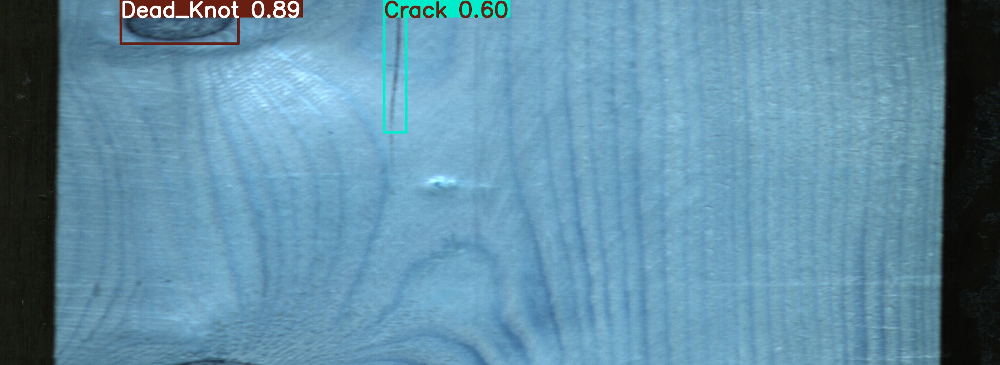


--- Sample 2: 101900003.jpg ---
Detections: 3
  Marrow: 75.40%
  Live_Knot: 47.79%
  Live_Knot: 25.08%


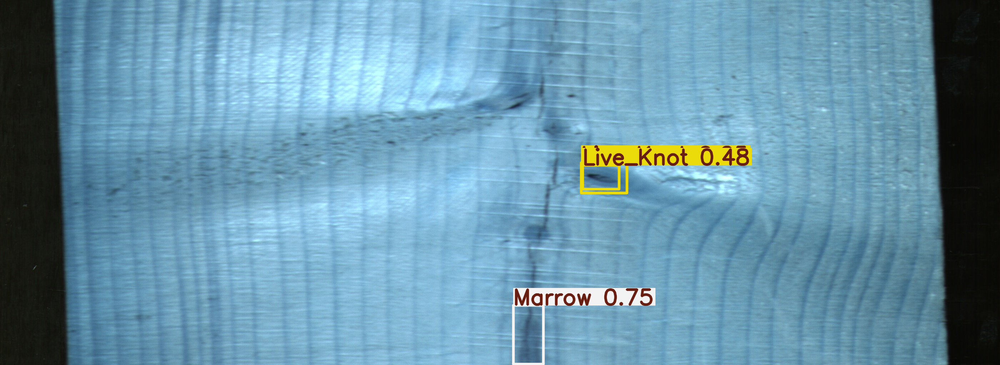


--- Sample 3: 100400005.jpg ---
Detections: 2
  Marrow: 89.31%
  Crack: 50.96%


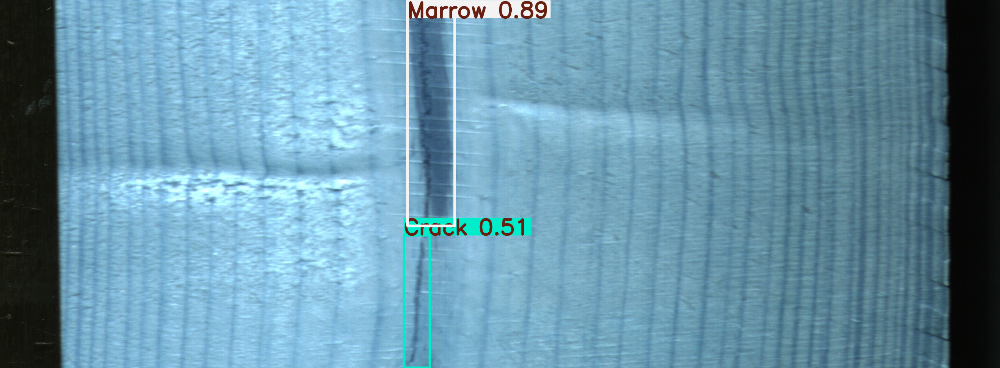


Inference test complete!


In [15]:
import cv2
import numpy as np
from pathlib import Path
from google.colab.patches import cv2_imshow
import random

random.seed(42)

# Load the trained model
trained_model = YOLO('/content/best.pt')

# Pick 3 random images from validation set
val_images = sorted(list((AUGMENTED_DIR / 'images' / 'val').glob('*')))
sample_images = random.sample(val_images, min(3, len(val_images)))

for i, img_path in enumerate(sample_images):
    print(f'\n--- Sample {i + 1}: {img_path.name} ---')

    # Run inference
    results = trained_model(str(img_path), conf=0.25, verbose=False)
    r = results[0]

    # Get annotated image
    annotated = r.plot()
    annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    # Display
    print(f'Detections: {len(r.boxes)}')
    for box, conf, cls_id in zip(r.boxes.xyxy, r.boxes.conf, r.boxes.cls):
        name = r.names[int(cls_id)]
        print(f'  {name}: {float(conf):.2%}')

    cv2_imshow(annotated_rgb)

print('\nInference test complete!')

---
## Summary

✅ **Dataset** — 4,000 images of wood surface defects (8 classes)

✅ **Auto-configured** — Created train/val/test split + `data.yaml`

✅ **Class-Aware Augmentation** — Minority classes (Quartzity, Marrow, Knot_missing) augmented with safe transforms

✅ **Training** — YOLOv8n for 20 epochs on T4 GPU

✅ **Export** — Trained weights at `/content/best.pt`

---
### Next Steps

1. Download `/content/best.pt` from Colab to your local machine
2. Place it in the project: `models/wood_defect_yolov8n.pt`
3. Run the webapp: `python webapp/main.py`

---
*Notebook generated for Computer-Vision-Project*